# Velocity Correction Speed Diffs

For each test patient, compare the **speed** (vector magnitude) of three
velocity-correction fields:

| Label | Description |
|---|---|
| **GT Correction** | Raw scanner correction = corrected - uncorrected velocity (mm/s) |
| **GT Poly Correction** | Ground-truth polynomial-fit correction x VENC (mm/s) |
| **Pred Poly Correction** | Model-predicted polynomial-fit correction x VENC (mm/s) |

For each patient a 3x3 grid is shown.  Rows and columns both index the
three correction types.  Diagonal cells show the correction speed map;
upper-triangle cell *(i, j)* shows the signed difference
`speed_row - speed_col` (lower triangle is omitted as redundant).
Air voxels are excluded via a magnitude-based tissue mask.

**Colour-scale conventions:**
- Diagonal: anchored to the GT Poly Correction speed range.
- Off-diagonal: all share a single symmetric range set by the
  GT Poly - Pred Poly difference.

In [13]:
import platform
from pathlib import Path

import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import pandas as pd

from vascular_superenhancement.utils.path_config import load_path_config, _PROJECT_ROOT

config_name = "local_mac" if platform.system() == "Darwin" else "all_patients"
pc = load_path_config(config_name)

WORKING_DIR = pc.working_dir
INFERENCE_DIR = WORKING_DIR.parent / "inference"
PATIENT_DATA_DIR = WORKING_DIR / "patient_data"
REPO_ROOT = _PROJECT_ROOT

RUN_NAME = "glowing-microwave_epoch-69"
COMPONENTS = ["vx", "vy", "vz"]
TIMEPOINT = 0

splits_df = pd.read_csv(REPO_ROOT / "splits" / "splits_01-15-26.csv")
test_patients = sorted(splits_df.loc[splits_df["split"] == "test", "patient_id"].tolist())
inferred_patients = sorted([d.name for d in (INFERENCE_DIR / RUN_NAME).iterdir() if d.is_dir()])
patients = sorted(set(test_patients) & set(inferred_patients))

patient_vencs = {}
for pid in patients:
    npz_path = PATIENT_DATA_DIR / pid / "nifti" / "velocity_correction" / f"poly_coefficients_{pid}.npz"
    if npz_path.exists():
        patient_vencs[pid] = float(np.load(npz_path)["venc"])
    else:
        pred_npz = (
            INFERENCE_DIR / RUN_NAME / pid
            / "predicted_corrected_velocity" / f"pred_poly_coefficients_{pid}.npz"
        )
        patient_vencs[pid] = float(np.load(pred_npz)["venc"]) if pred_npz.exists() else np.nan

print(f"Repo root:     {REPO_ROOT}")
print(f"Working dir:   {WORKING_DIR}")
print(f"Inference dir: {INFERENCE_DIR}")
print(f"Run:           {RUN_NAME}")
print(f"Patients ({len(patients)}): {patients}")

Repo root:     /home/ayeluru/vascular-superenhancement-4d-flow
Working dir:   /home/ayeluru/vascular-superenhancement-4d-flow/working_dir/all_patients
Inference dir: /home/ayeluru/vascular-superenhancement-4d-flow/working_dir/inference
Run:           glowing-microwave_epoch-69
Patients (28): ['Balboloop', 'Biswifo', 'Bomatog', 'Boochuto', 'Boumorim', 'Bovutou', 'Cadotueg', 'Detodu', 'Diecudey', 'Diepami', 'Diequipi', 'Dithigog', 'Dublafer', 'Dujomal', 'Elagieg', 'Golotag', 'Grequafie', 'Gueshifa', 'Kuquelok', 'Oduskueb', 'Quetode', 'Runusath', 'Sepigoo', 'Stonscuetof', 'Suquepog', 'Tercippun', 'Tiepolem', 'Tisupey']


In [14]:
AIR_THRESHOLD = 0.05
MAG_NORM_PERCENTILE = 99.0

LABELS = ["GT Correction", "GT Poly Correction", "Pred Poly Correction"]
SHORT_LABELS = ["GT Corr", "GT Poly", "Pred Poly"]


def build_tissue_mask(pid, t=0):
    """Return a boolean tissue mask (True = tissue) from the magnitude image."""
    mag_path = (
        PATIENT_DATA_DIR / pid / "nifti"
        / f"4d_flow_mag_{pid}_per_timepoint_corr_fov"
        / f"4d_flow_mag_{pid}_frame_{t:02d}.nii.gz"
    )
    if not mag_path.exists():
        return None
    mag = nib.load(mag_path).get_fdata(dtype=np.float32)
    norm_val = np.percentile(mag, MAG_NORM_PERCENTILE)
    return (mag / max(norm_val, 1e-8)) >= AIR_THRESHOLD


def load_correction_speeds(pid, t=0):
    """Load three correction speed maps for *pid*, all in mm/s.

    Returns
    -------
    gt_corr_speed   : |corrected - uncorrected|
    gt_poly_speed   : |GT poly correction| * VENC
    pred_poly_speed : |predicted poly correction| * VENC
    tissue_mask     : ndarray or None
    """
    venc = patient_vencs[pid]
    nifti_dir = PATIENT_DATA_DIR / pid / "nifti"
    pred_dir = INFERENCE_DIR / RUN_NAME / pid / "predicted_corrected_velocity"

    tissue_mask = build_tissue_mask(pid, t)

    gt_corr_sq = np.float32(0)
    gt_poly_sq = np.float32(0)
    pred_poly_sq = np.float32(0)

    for comp in COMPONENTS:
        uncorr_path = (
            nifti_dir / f"4d_flow_{comp}_{pid}_per_timepoint_corr_fov"
            / f"4d_flow_{comp}_{pid}_frame_{t:02d}.nii.gz"
        )
        gt_corr_path = (
            nifti_dir / f"4d_flow_{comp}_corr_{pid}_per_timepoint"
            / f"4d_flow_{comp}_corr_{pid}_frame_{t:02d}.nii.gz"
        )
        gt_poly_path = (
            nifti_dir / "velocity_correction"
            / f"ground_truth_correction_{comp}_{pid}.nii.gz"
        )
        pred_poly_path = pred_dir / f"pred_correction_{comp}_{pid}.nii.gz"

        uncorr = nib.load(uncorr_path).get_fdata(dtype=np.float32)
        gt_corr_v = nib.load(gt_corr_path).get_fdata(dtype=np.float32)
        gt_poly = nib.load(gt_poly_path).get_fdata(dtype=np.float32)
        pred_poly = nib.load(pred_poly_path).get_fdata(dtype=np.float32)

        gt_corr_sq = gt_corr_sq + (gt_corr_v - uncorr) ** 2
        gt_poly_sq = gt_poly_sq + (gt_poly * venc) ** 2
        pred_poly_sq = pred_poly_sq + (pred_poly * venc) ** 2

    return (
        np.sqrt(gt_corr_sq),
        np.sqrt(gt_poly_sq),
        np.sqrt(pred_poly_sq),
        tissue_mask,
    )


print("Helpers defined.")

Helpers defined.


## Per-patient 3x3 speed-diff grids

  0%|          | 0/28 [00:00<?, ?it/s]

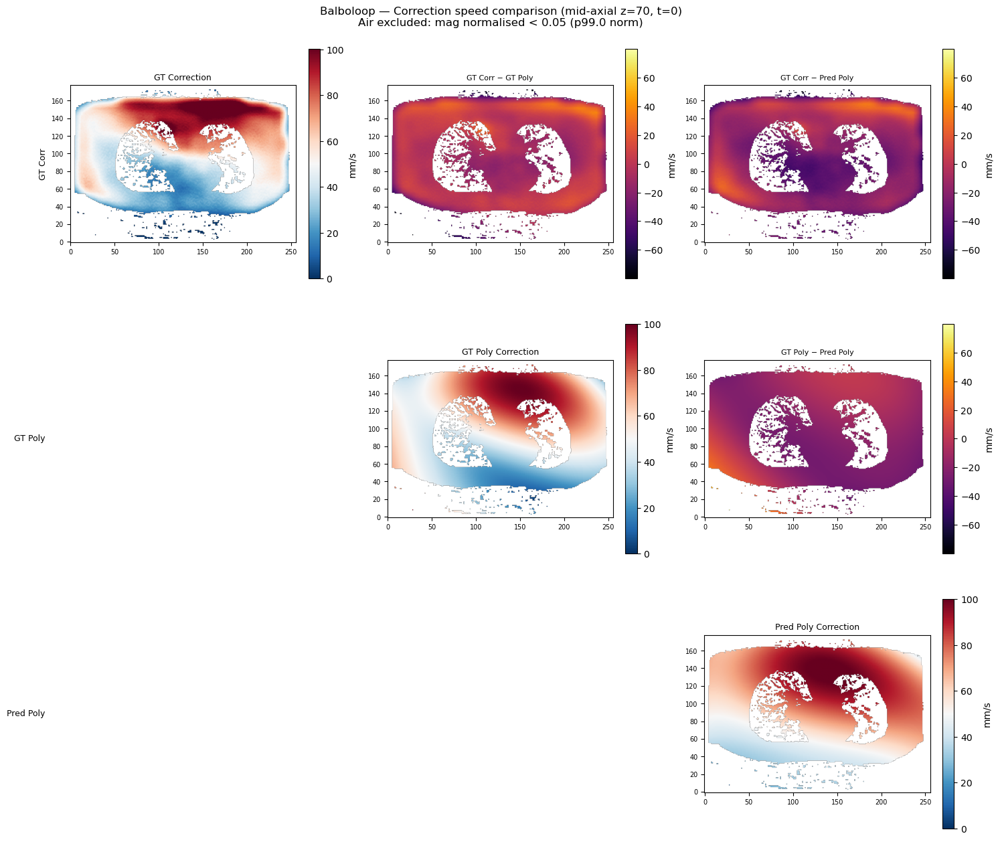

  4%|▎         | 1/28 [00:01<00:41,  1.54s/it]

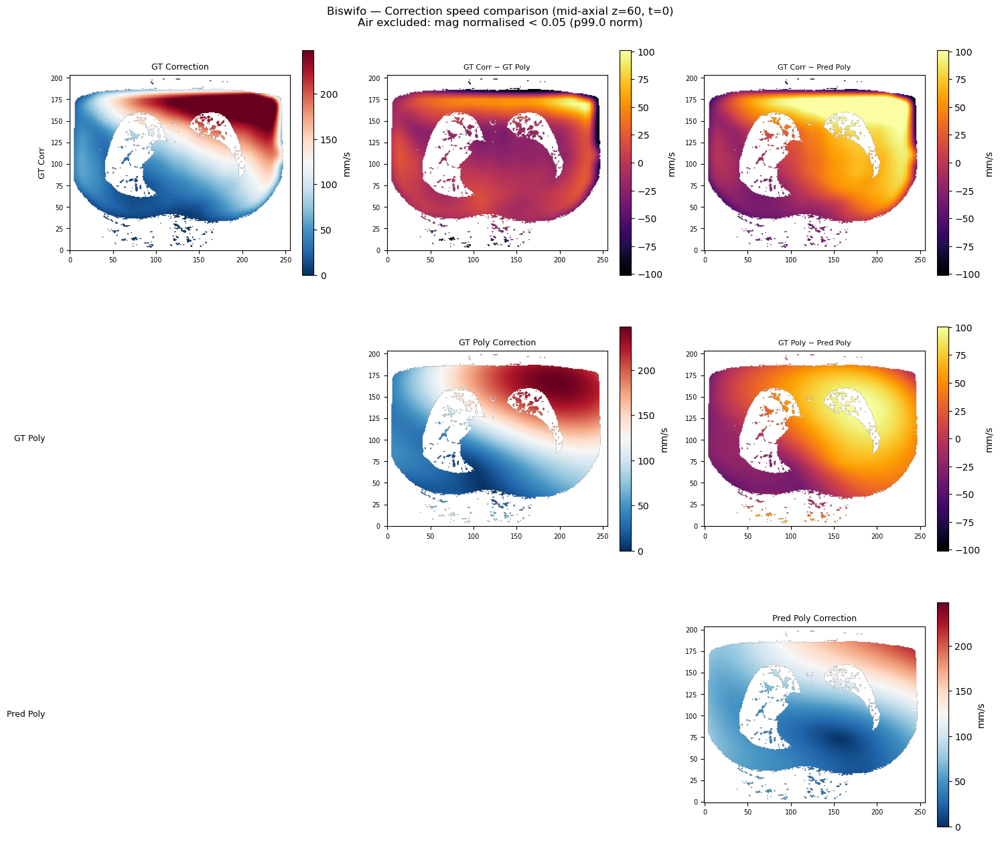

  7%|▋         | 2/28 [00:02<00:38,  1.47s/it]

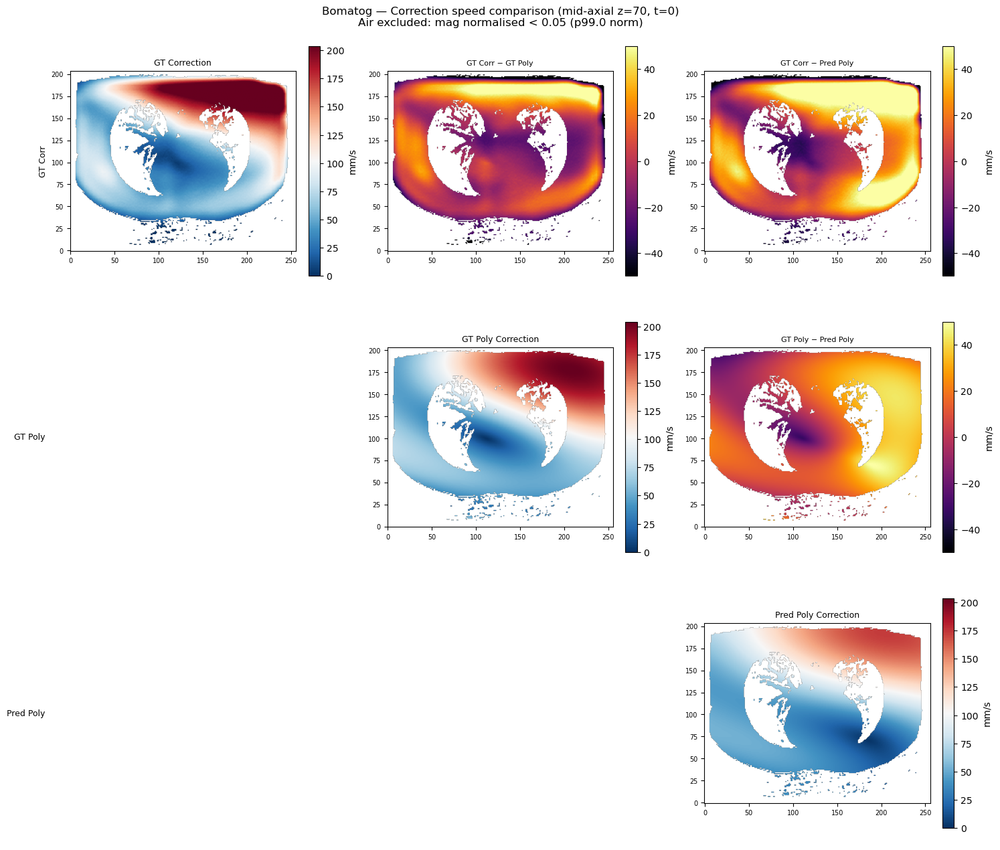

 11%|█         | 3/28 [00:06<01:03,  2.54s/it]

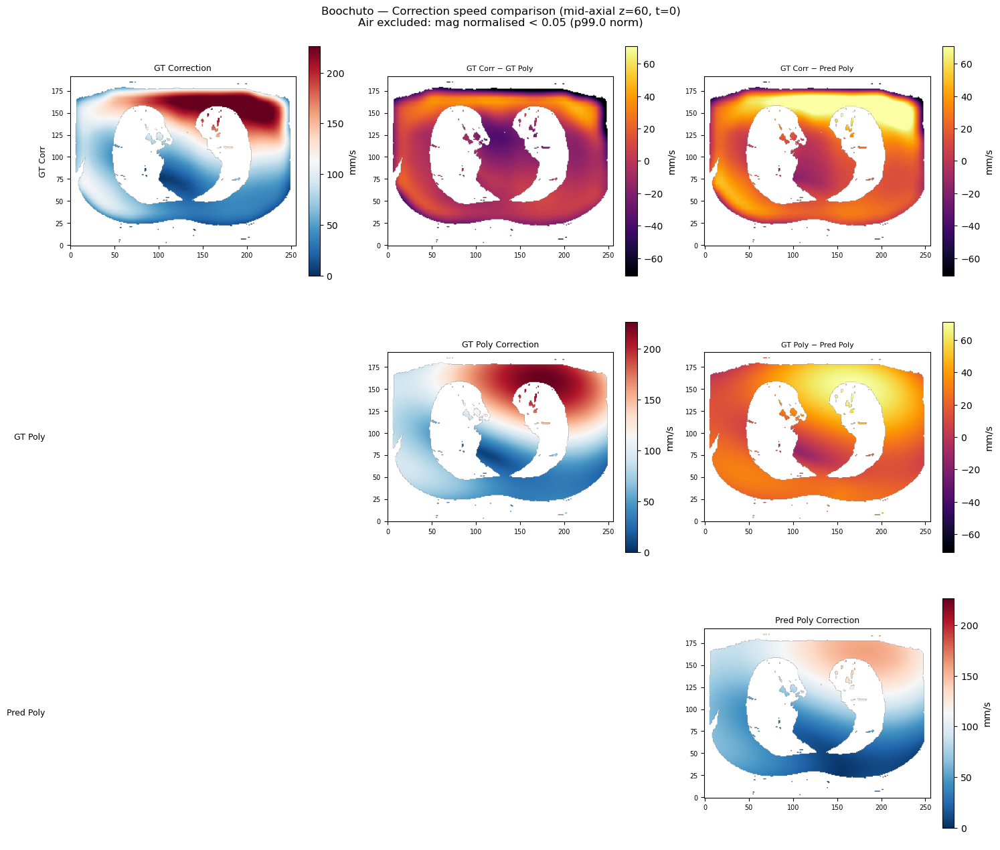

 14%|█▍        | 4/28 [00:08<00:49,  2.06s/it]

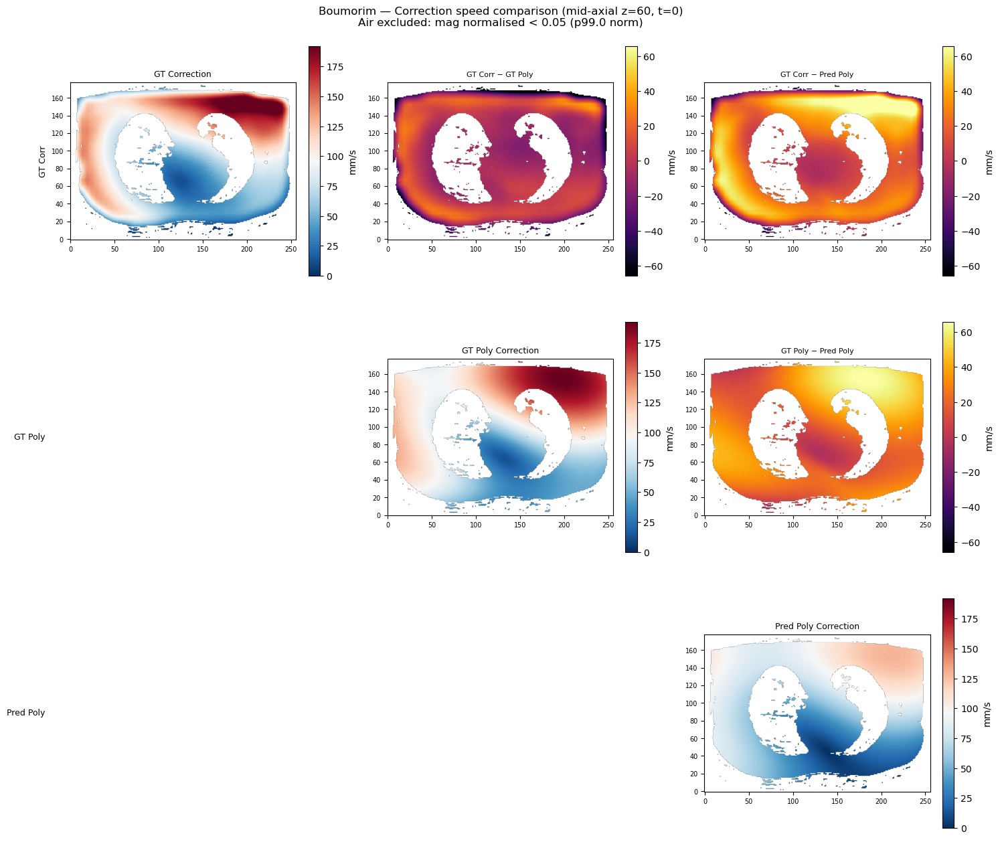

 18%|█▊        | 5/28 [00:09<00:41,  1.79s/it]

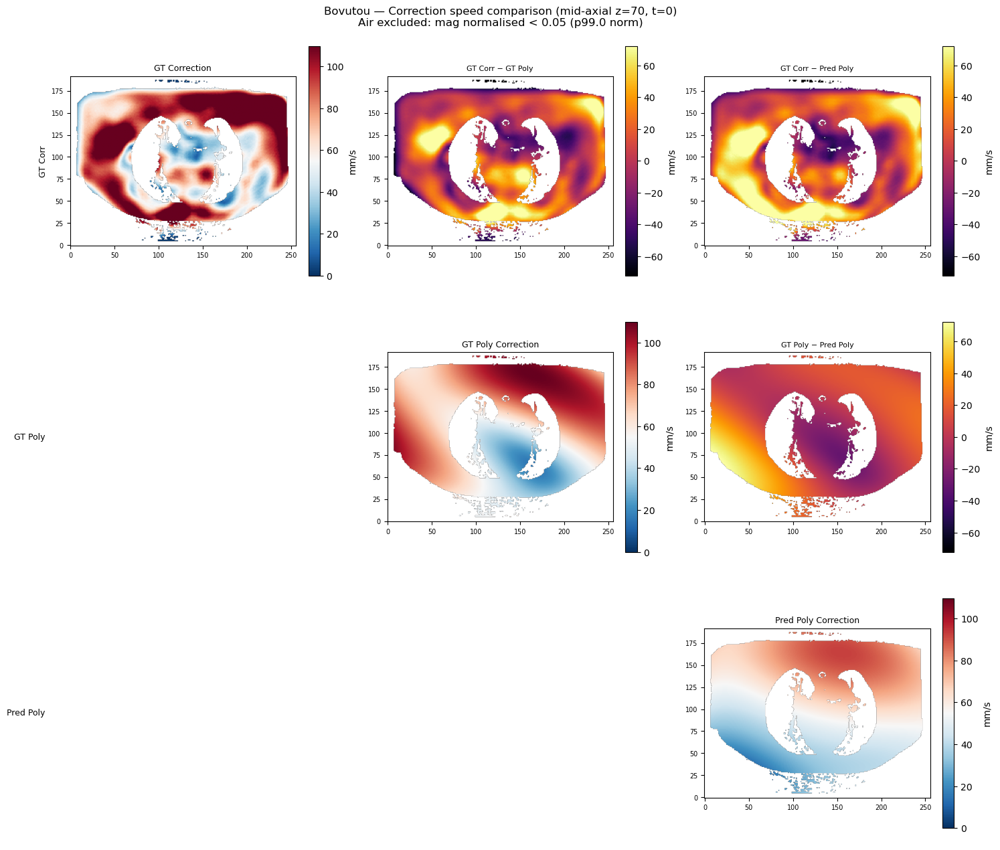

 21%|██▏       | 6/28 [00:10<00:37,  1.70s/it]

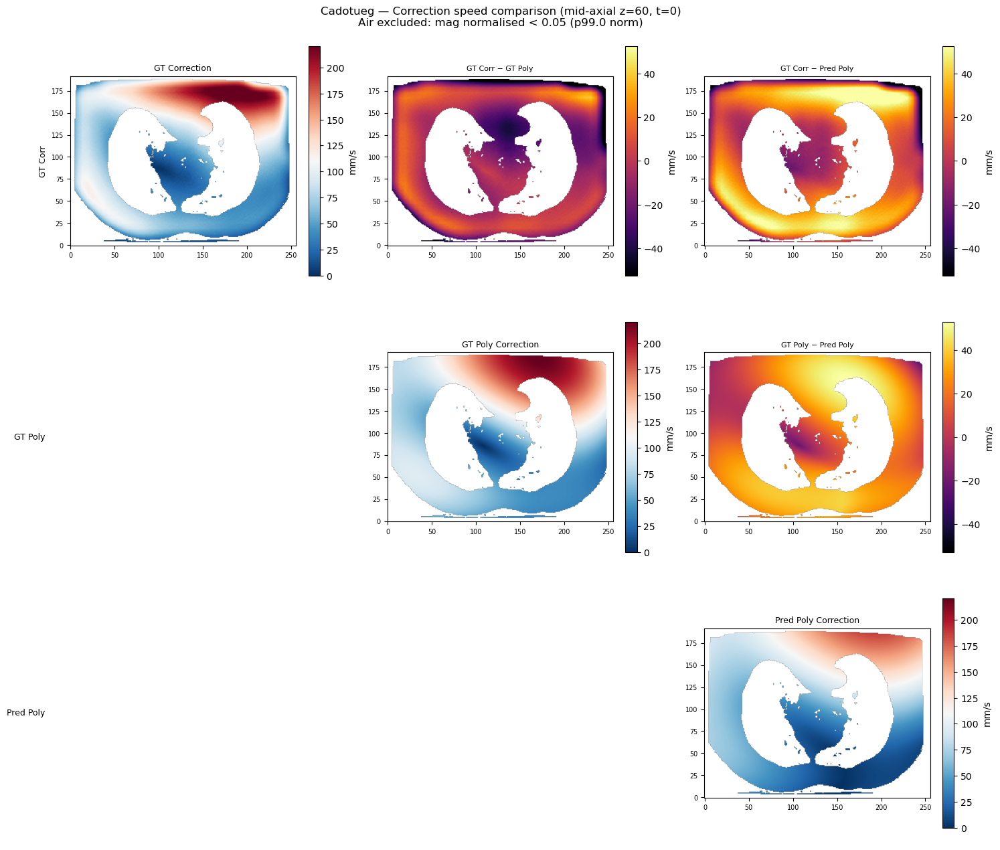

 25%|██▌       | 7/28 [00:12<00:33,  1.60s/it]

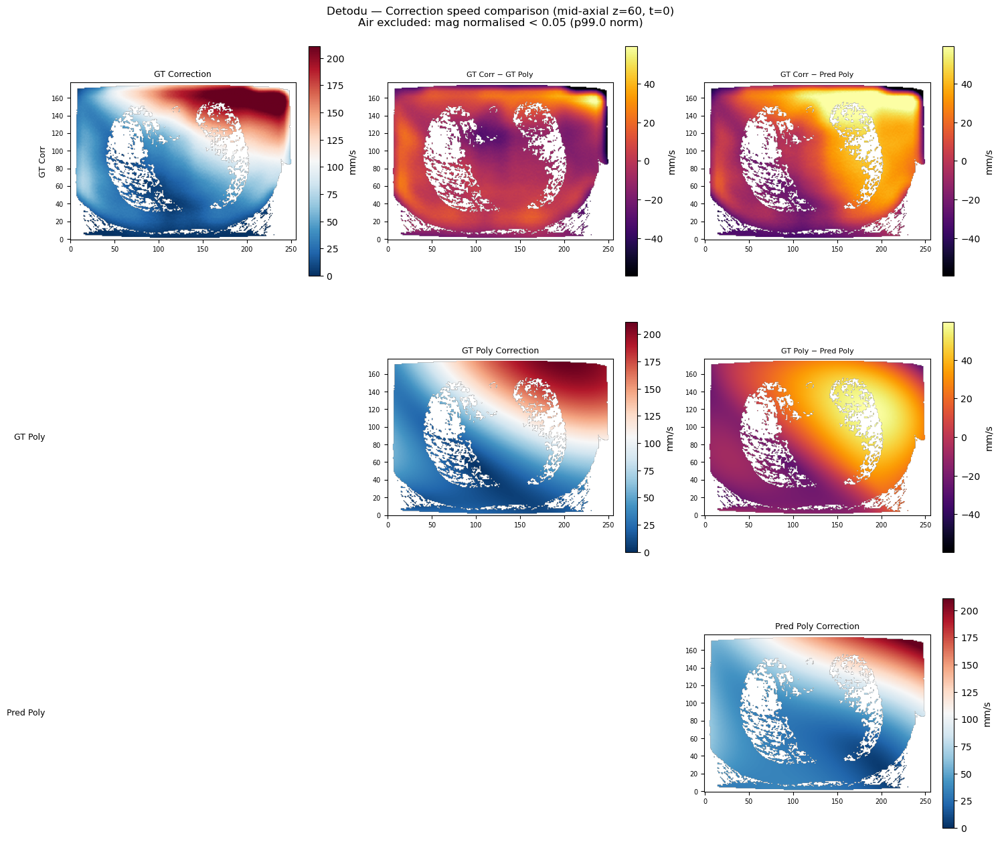

 29%|██▊       | 8/28 [00:13<00:30,  1.52s/it]

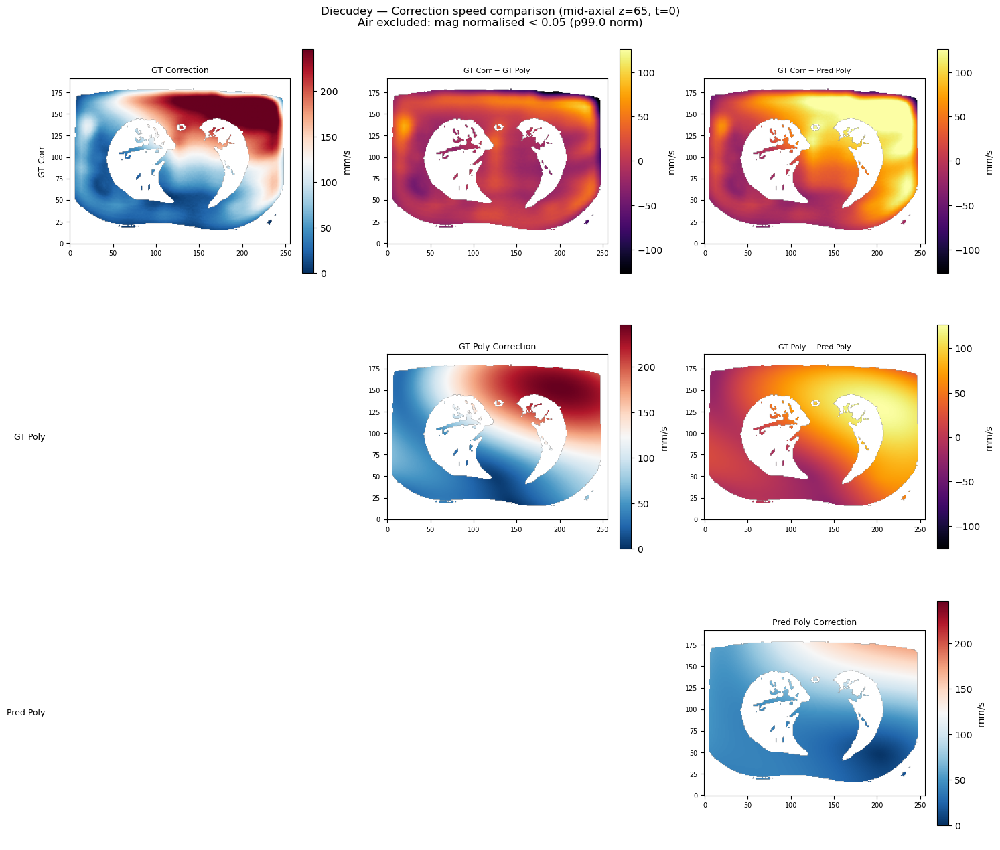

 32%|███▏      | 9/28 [00:15<00:32,  1.70s/it]

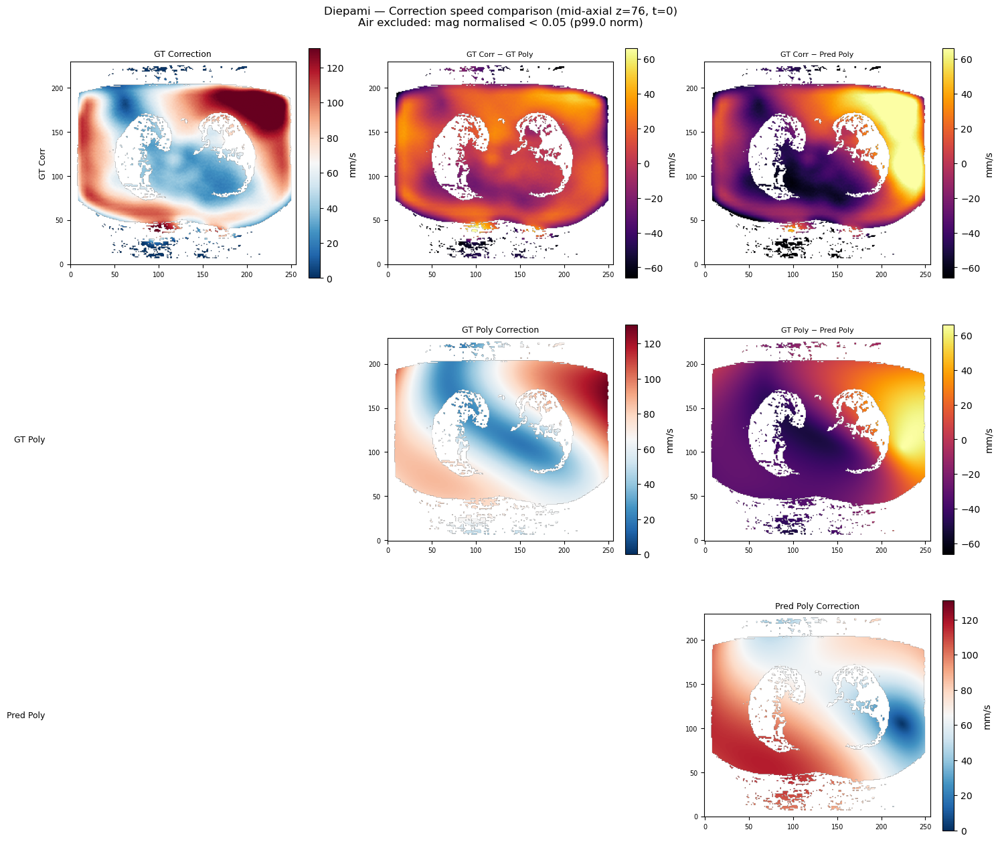

 36%|███▌      | 10/28 [00:18<00:34,  1.93s/it]

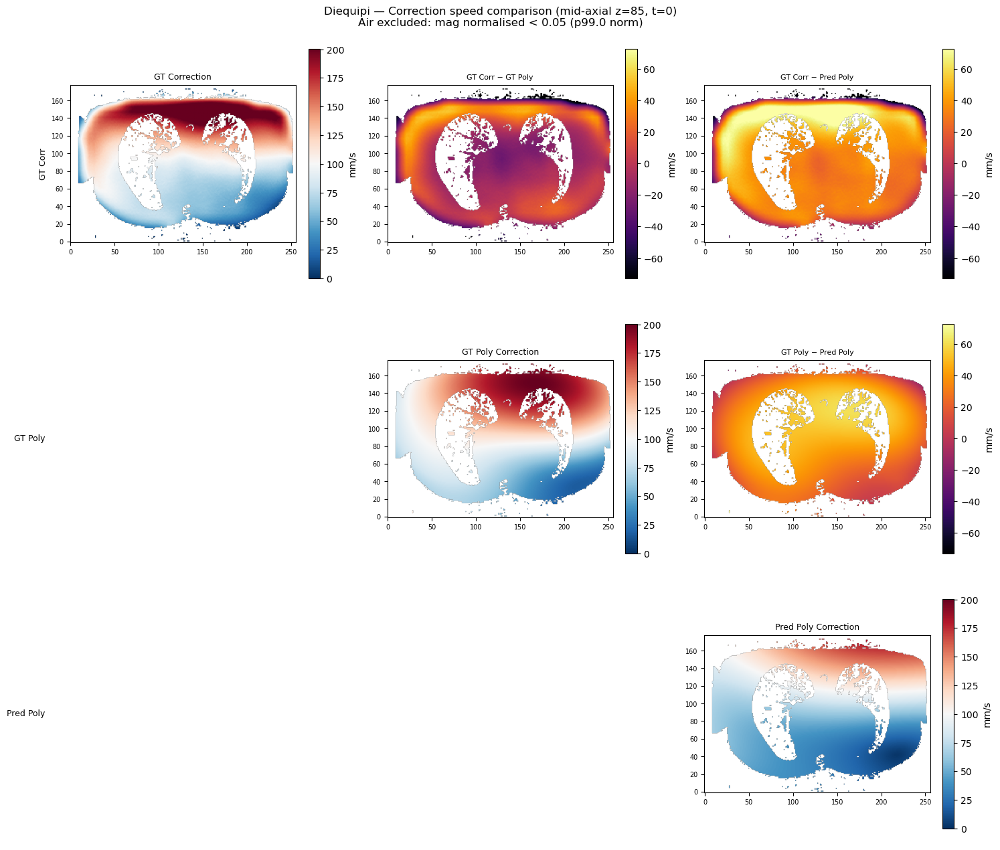

 39%|███▉      | 11/28 [00:20<00:32,  1.91s/it]

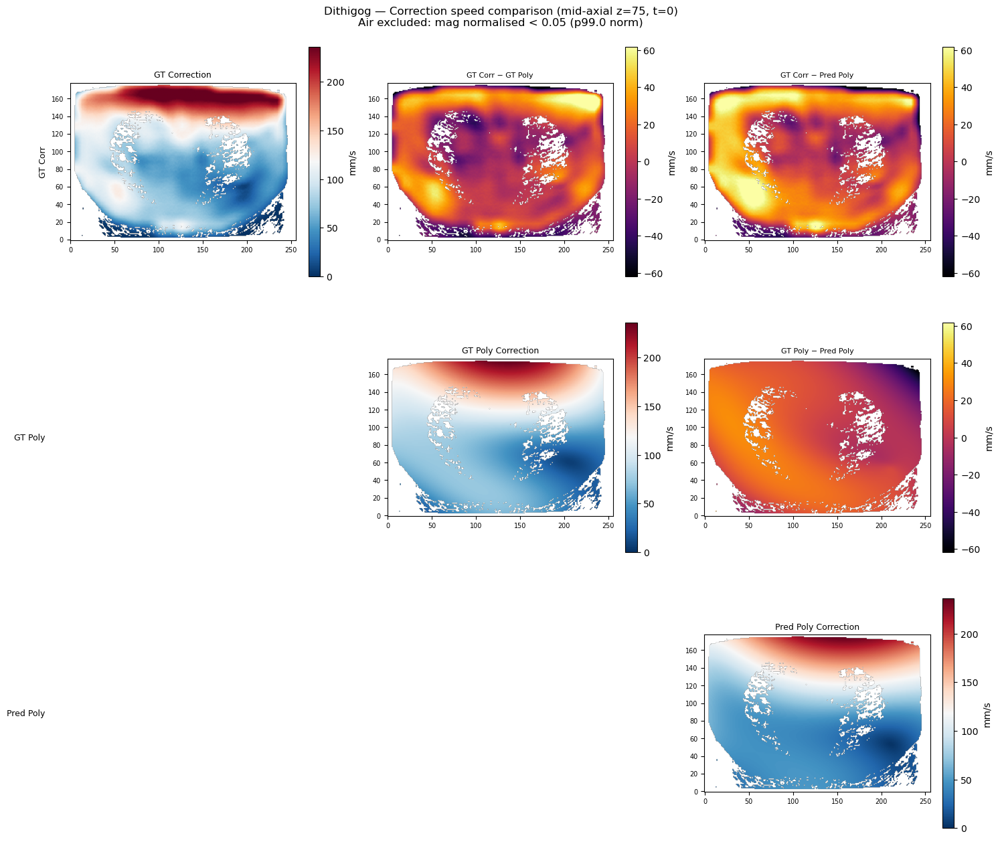

 43%|████▎     | 12/28 [00:22<00:32,  2.01s/it]

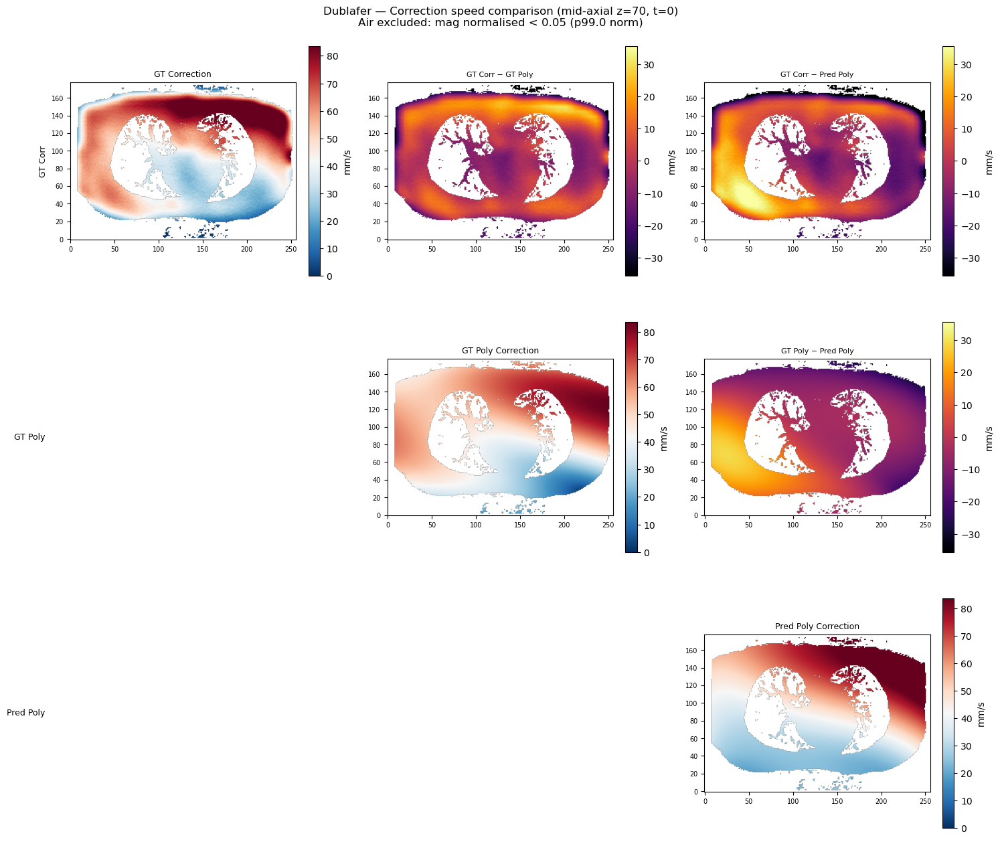

 46%|████▋     | 13/28 [00:23<00:27,  1.86s/it]

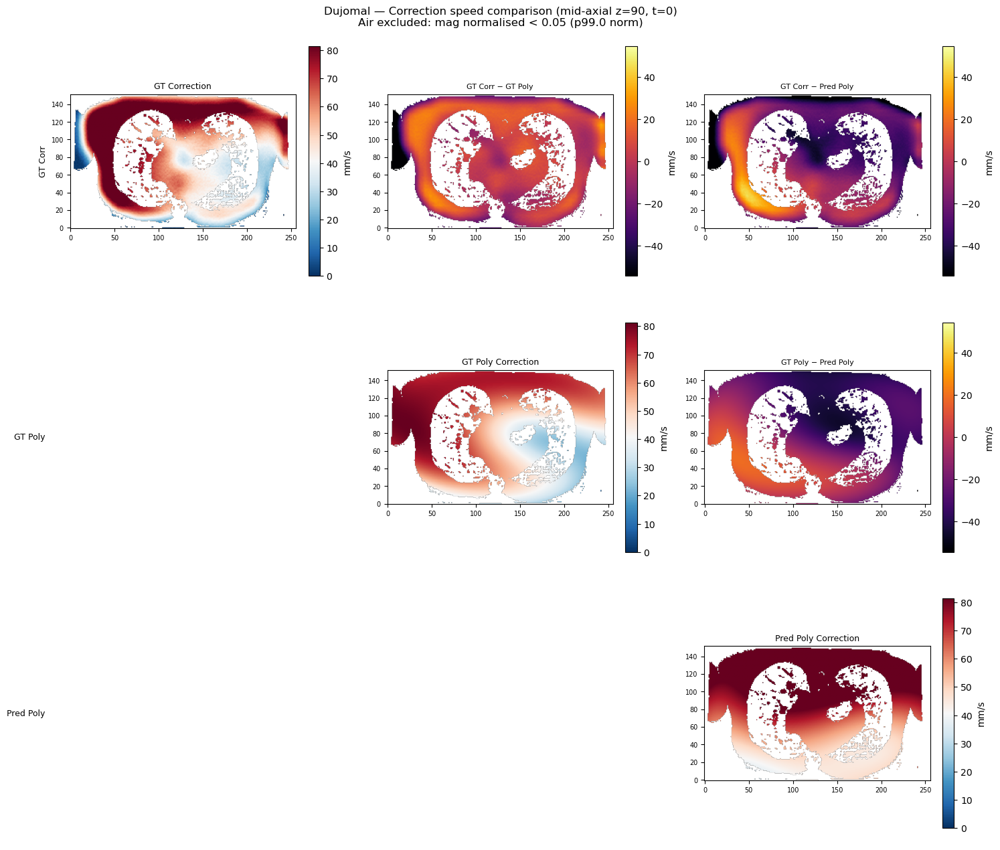

 50%|█████     | 14/28 [00:26<00:27,  2.00s/it]

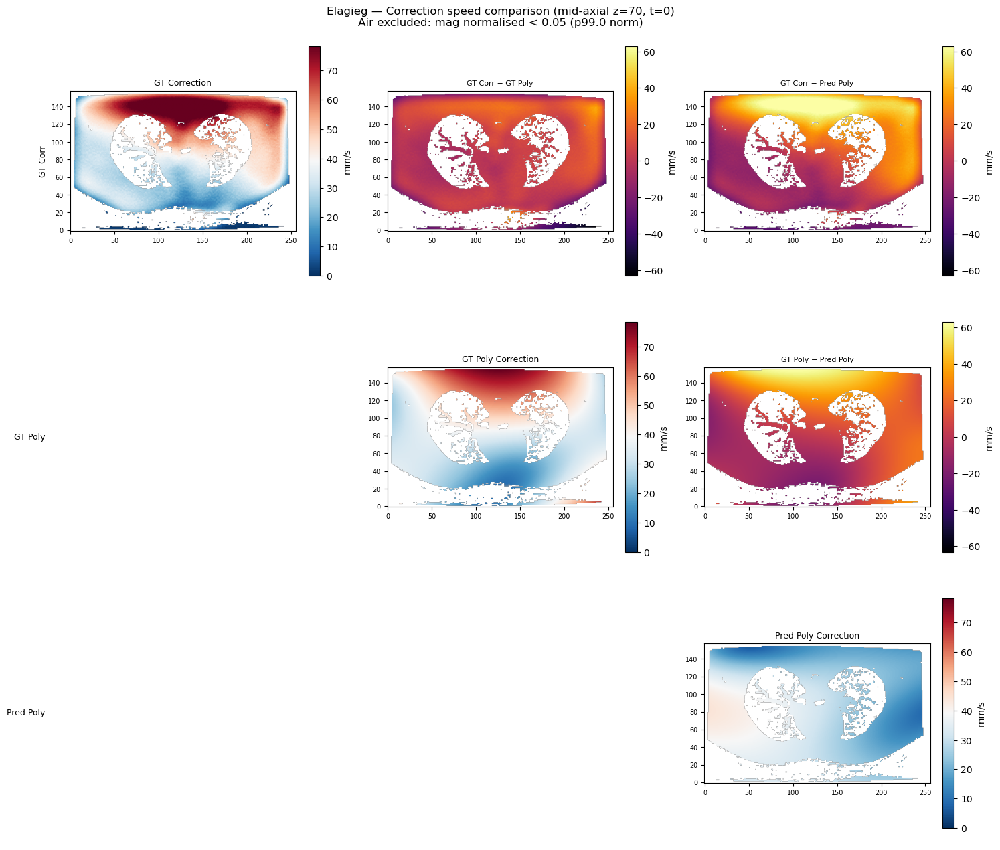

 54%|█████▎    | 15/28 [00:27<00:23,  1.81s/it]

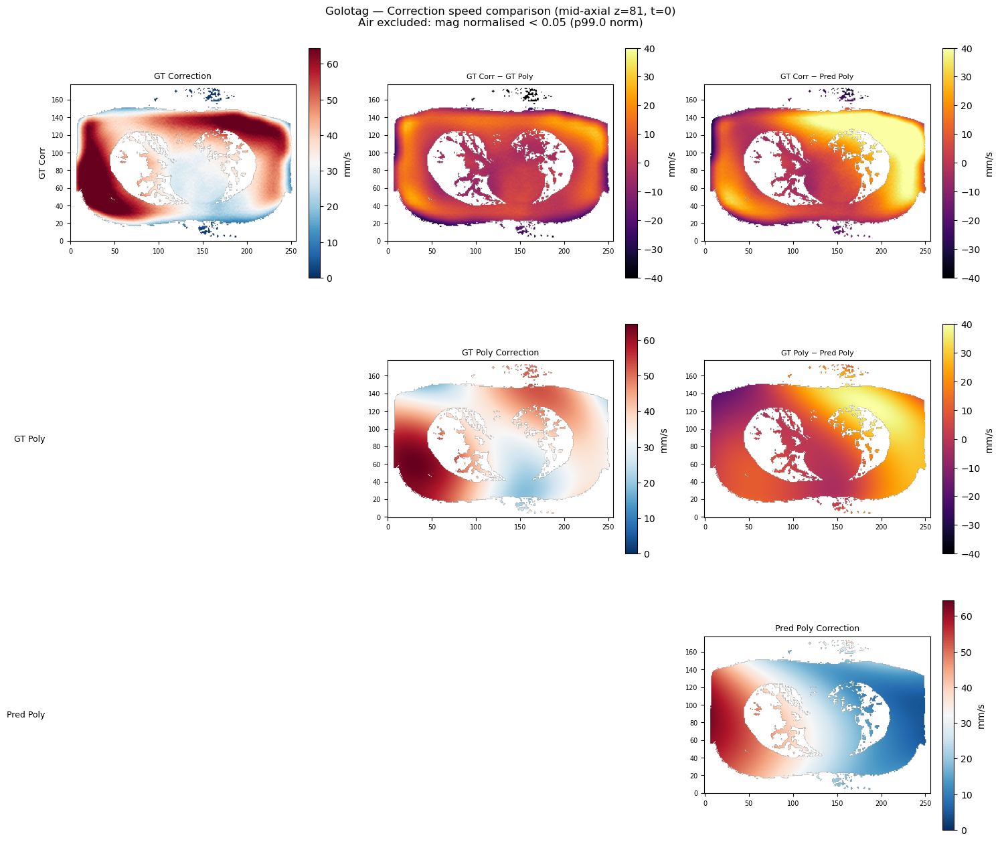

 57%|█████▋    | 16/28 [00:29<00:23,  1.94s/it]

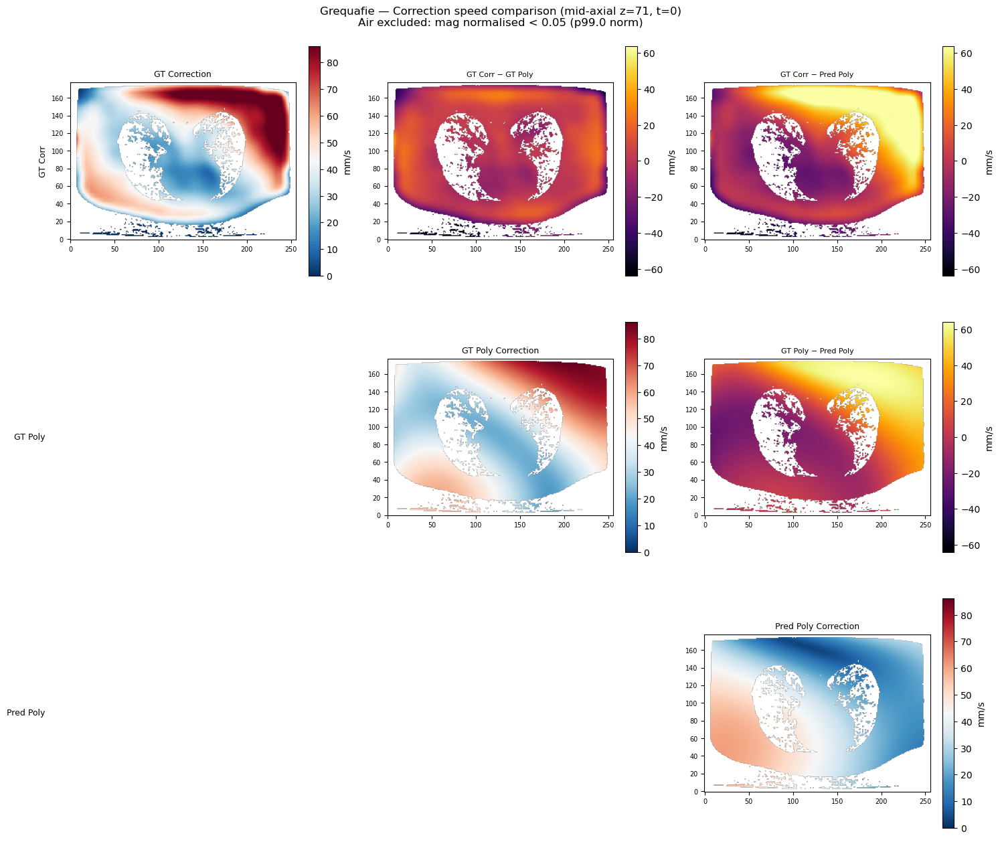

 61%|██████    | 17/28 [00:31<00:19,  1.81s/it]

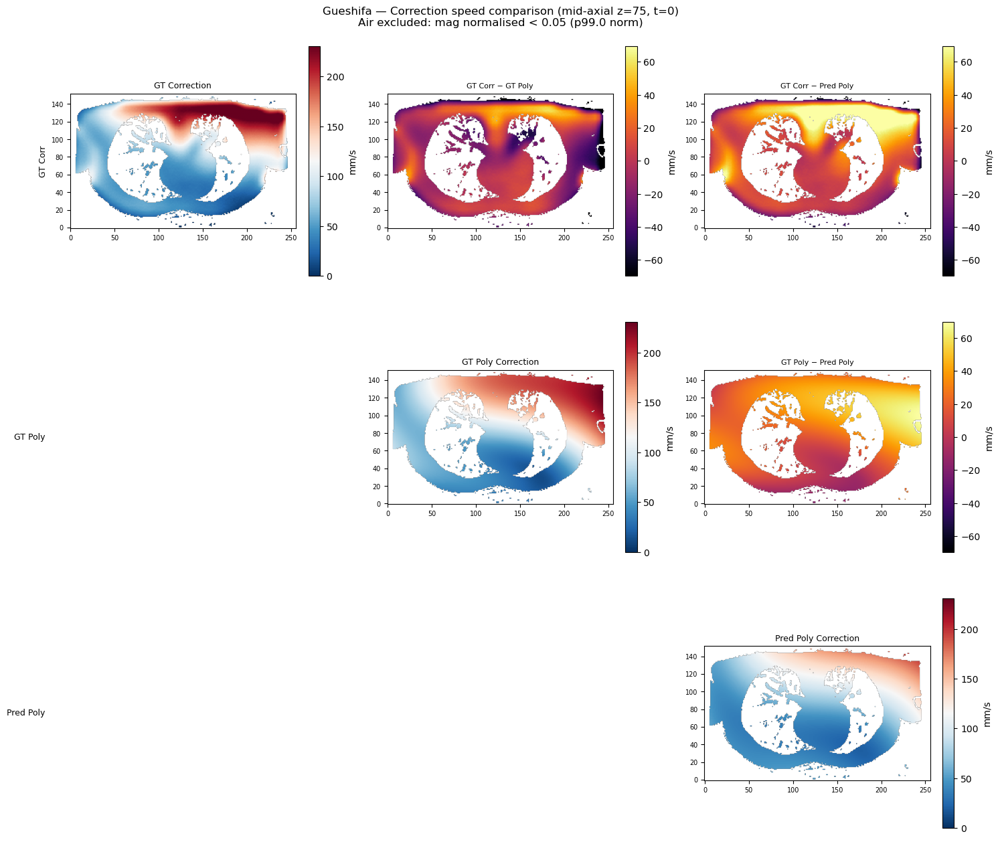

 64%|██████▍   | 18/28 [00:33<00:18,  1.89s/it]

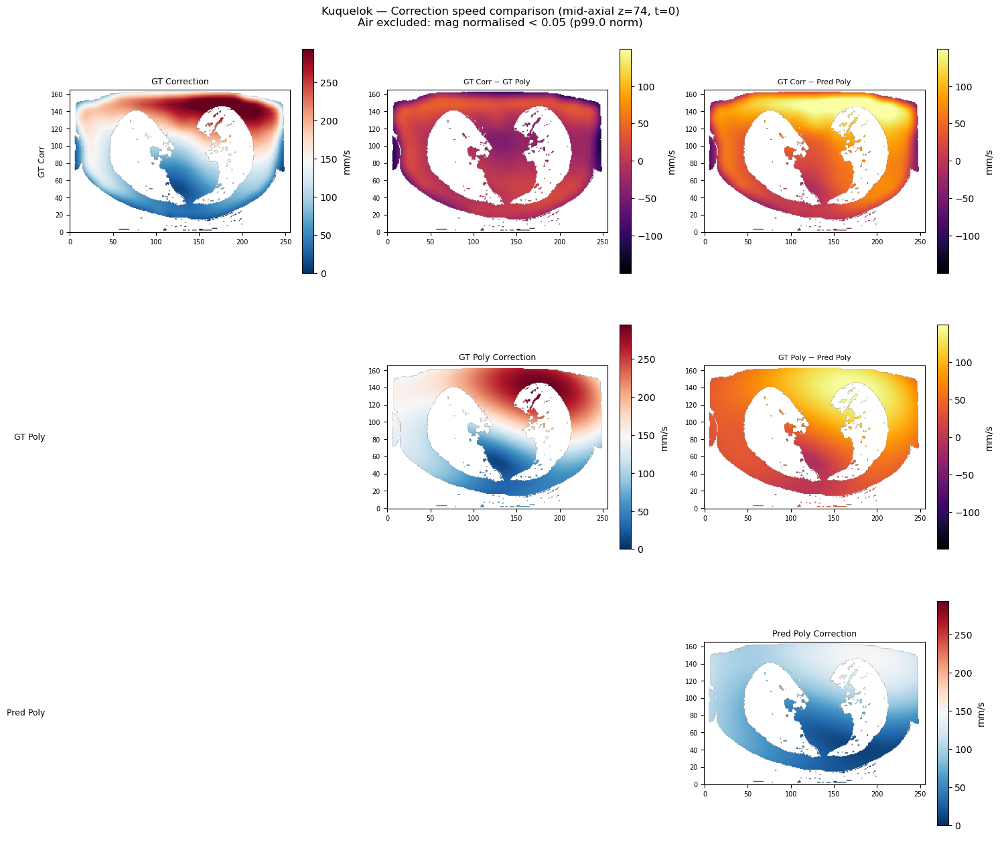

 68%|██████▊   | 19/28 [00:34<00:15,  1.75s/it]

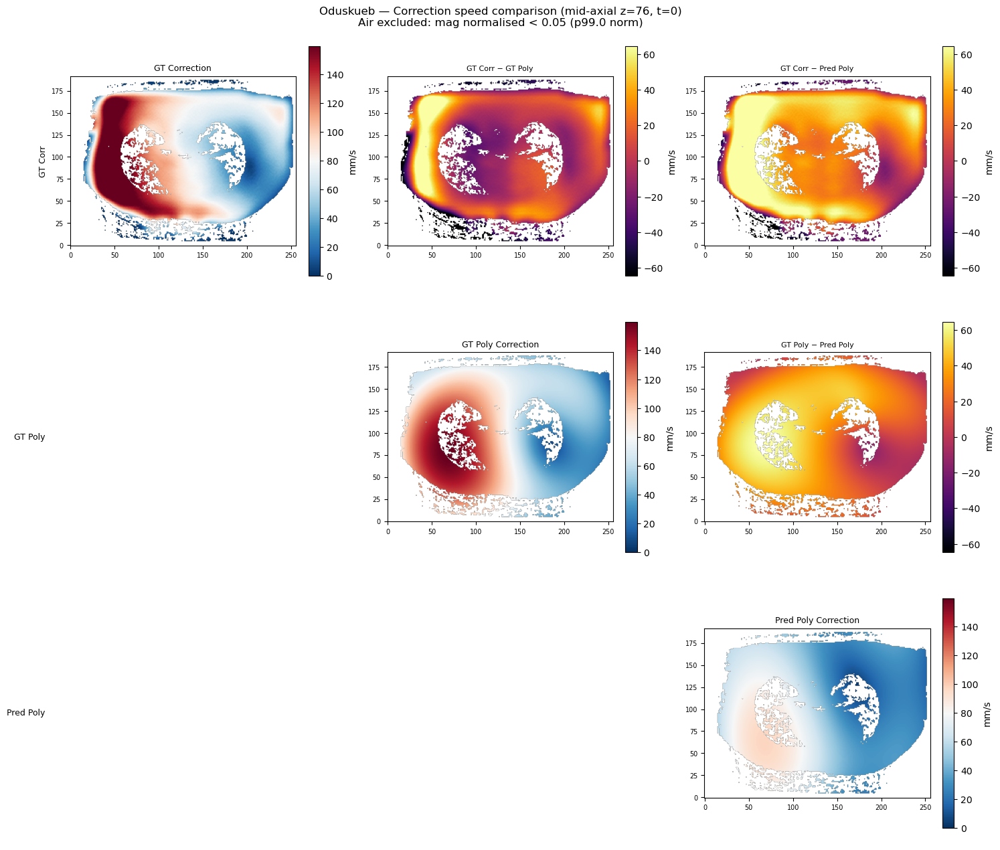

 71%|███████▏  | 20/28 [00:37<00:15,  1.96s/it]

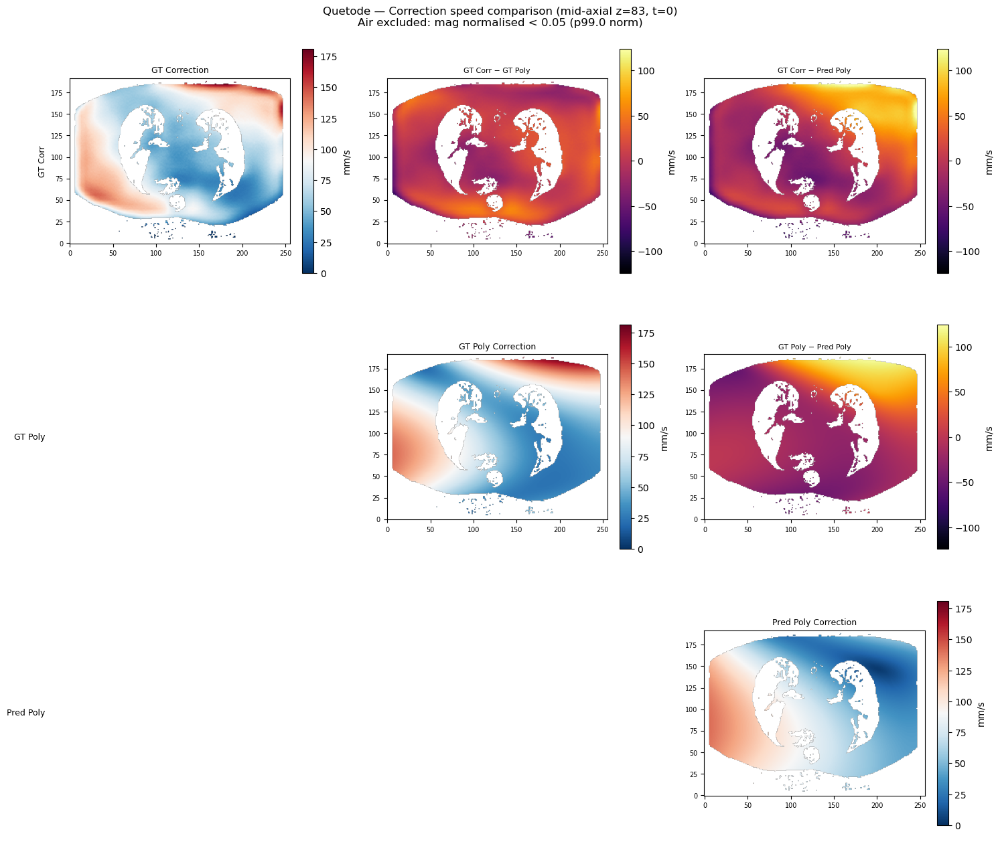

 75%|███████▌  | 21/28 [00:38<00:13,  1.89s/it]

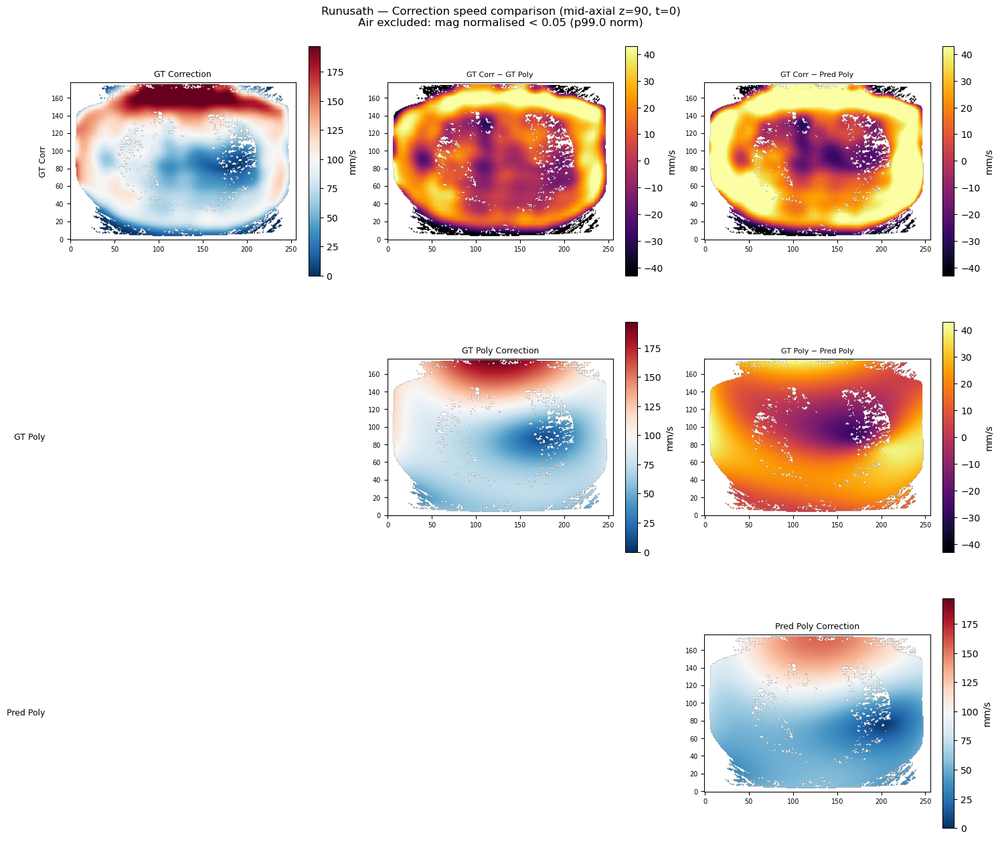

 79%|███████▊  | 22/28 [00:40<00:11,  1.85s/it]

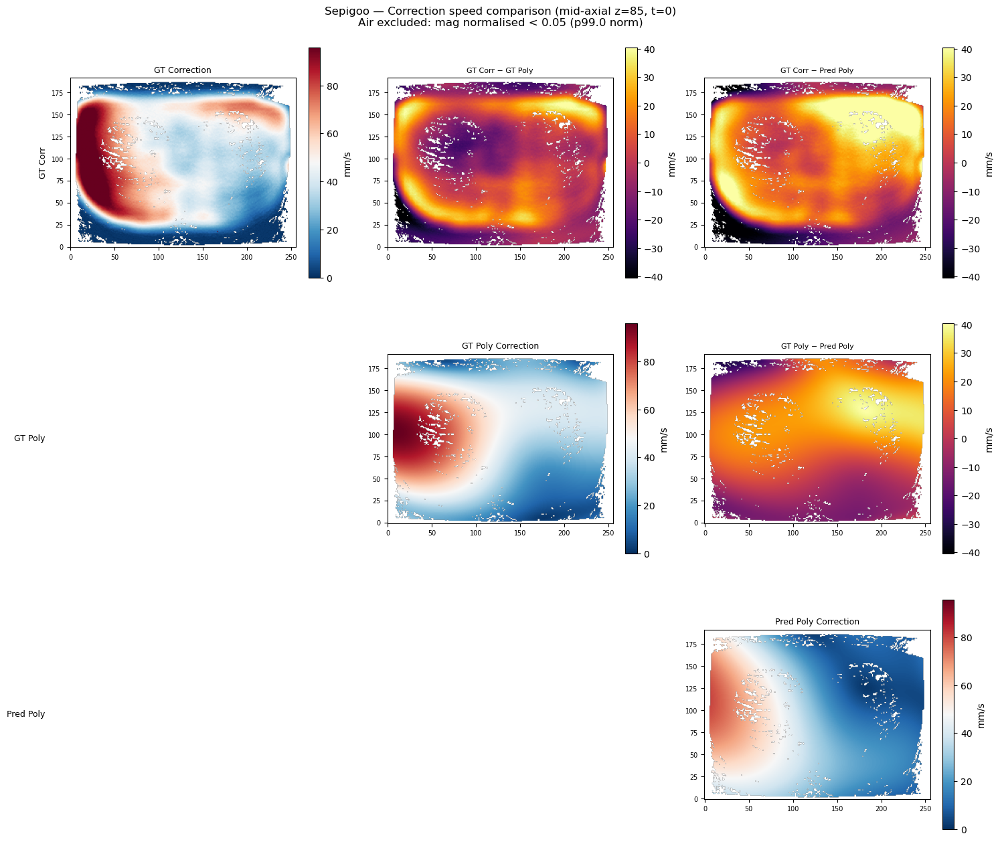

 82%|████████▏ | 23/28 [00:45<00:13,  2.70s/it]

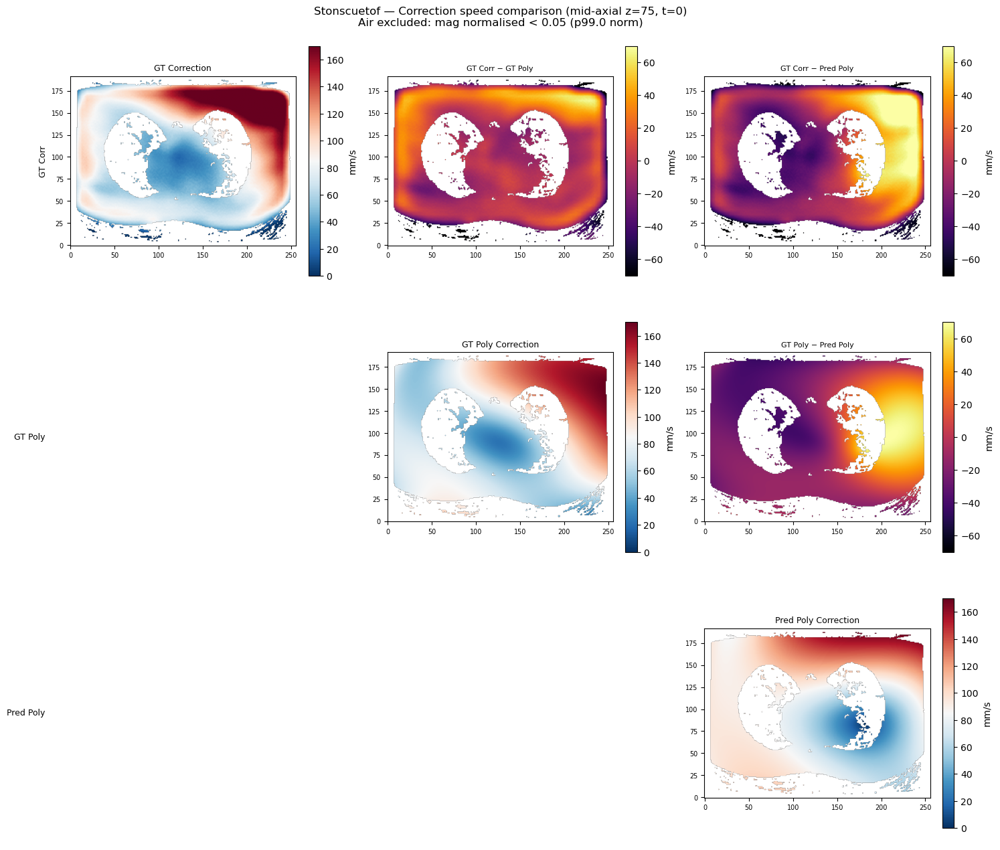

 86%|████████▌ | 24/28 [00:46<00:09,  2.36s/it]

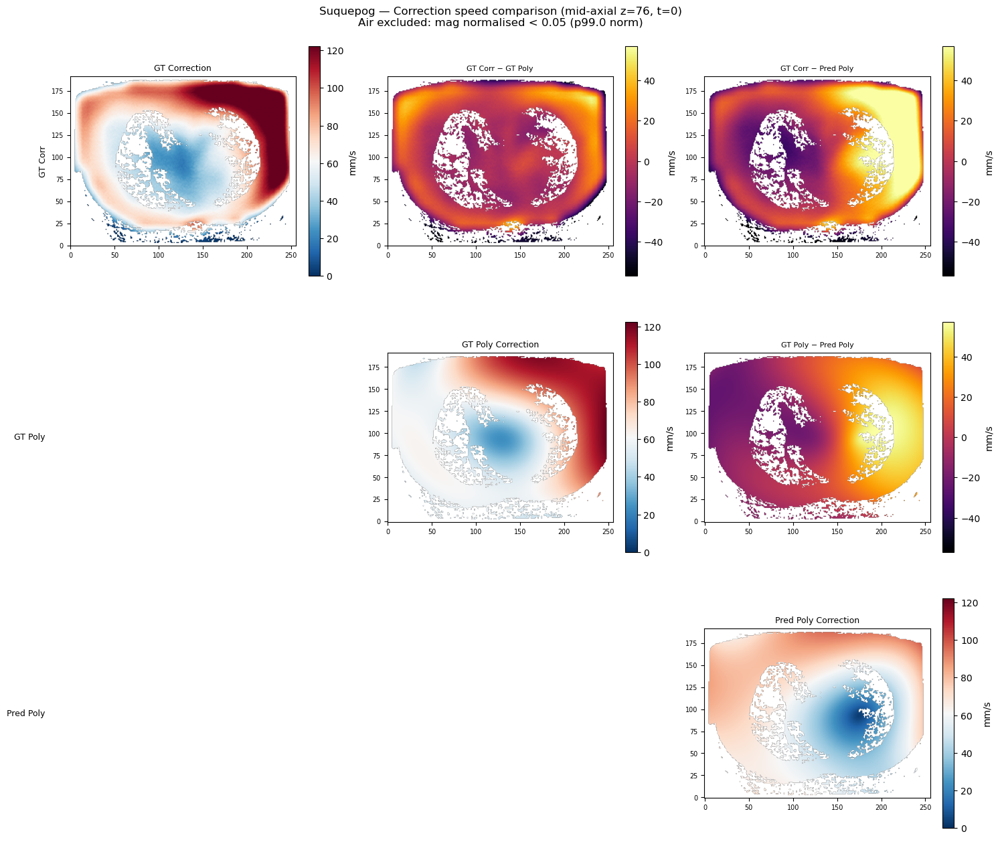

 89%|████████▉ | 25/28 [00:49<00:07,  2.43s/it]

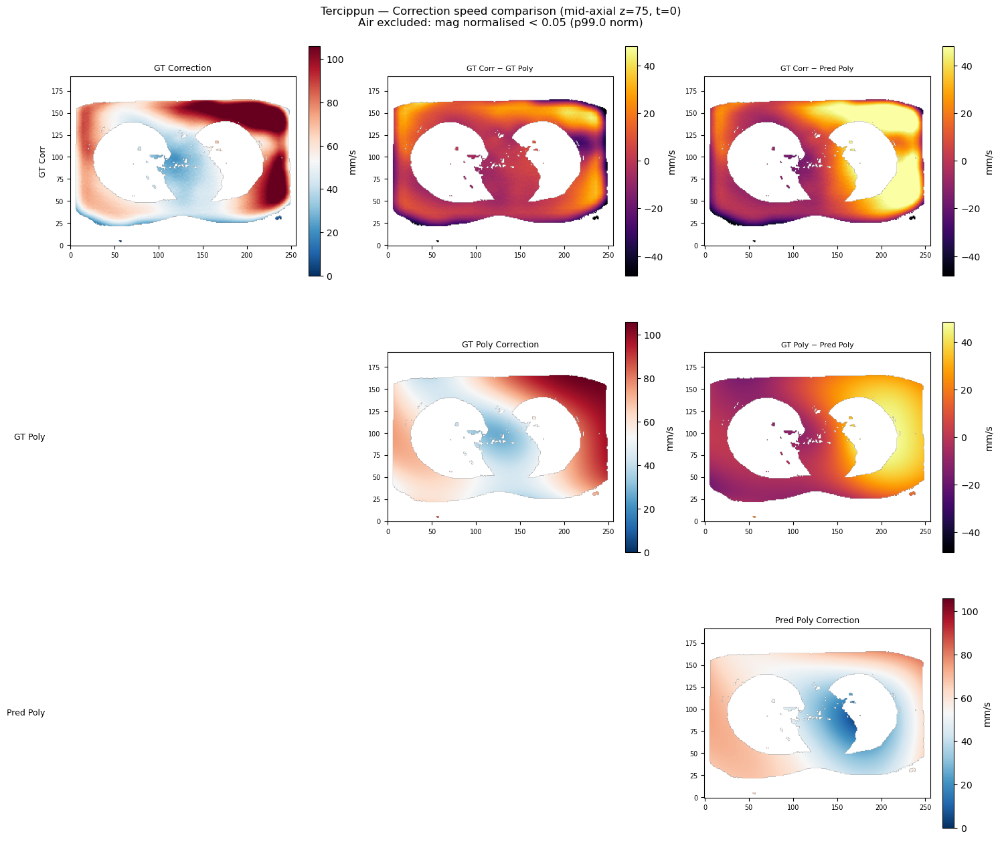

 93%|█████████▎| 26/28 [00:51<00:04,  2.17s/it]

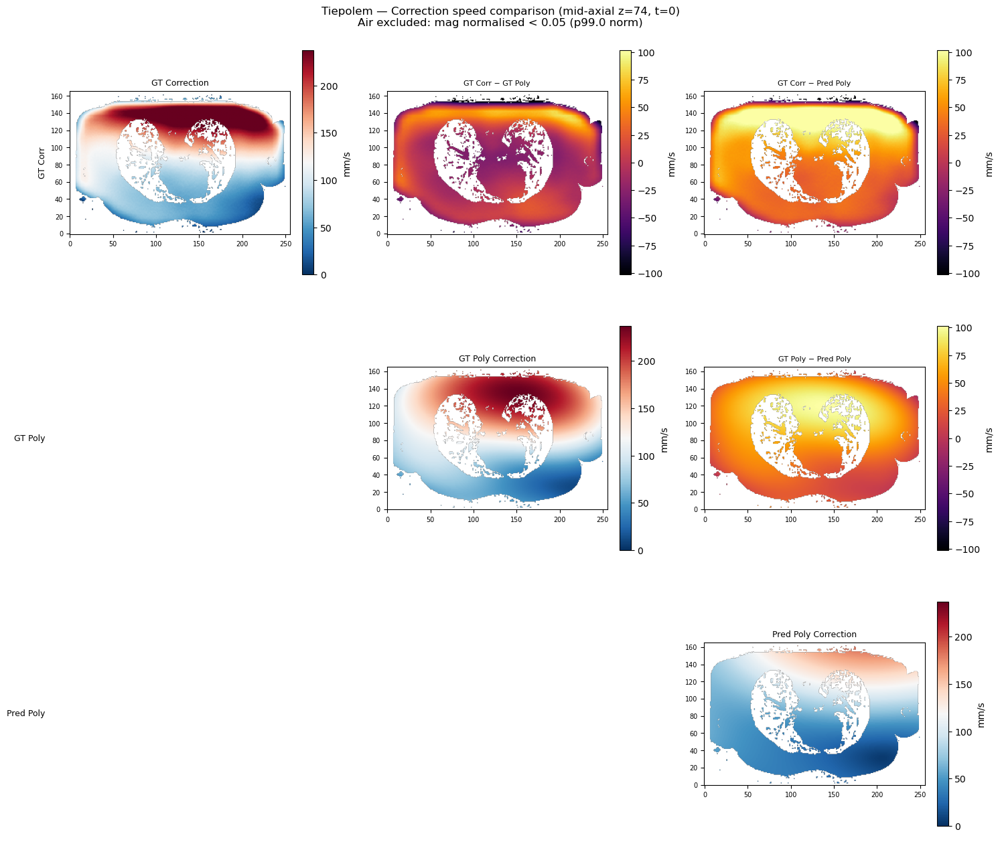

 96%|█████████▋| 27/28 [00:53<00:02,  2.17s/it]

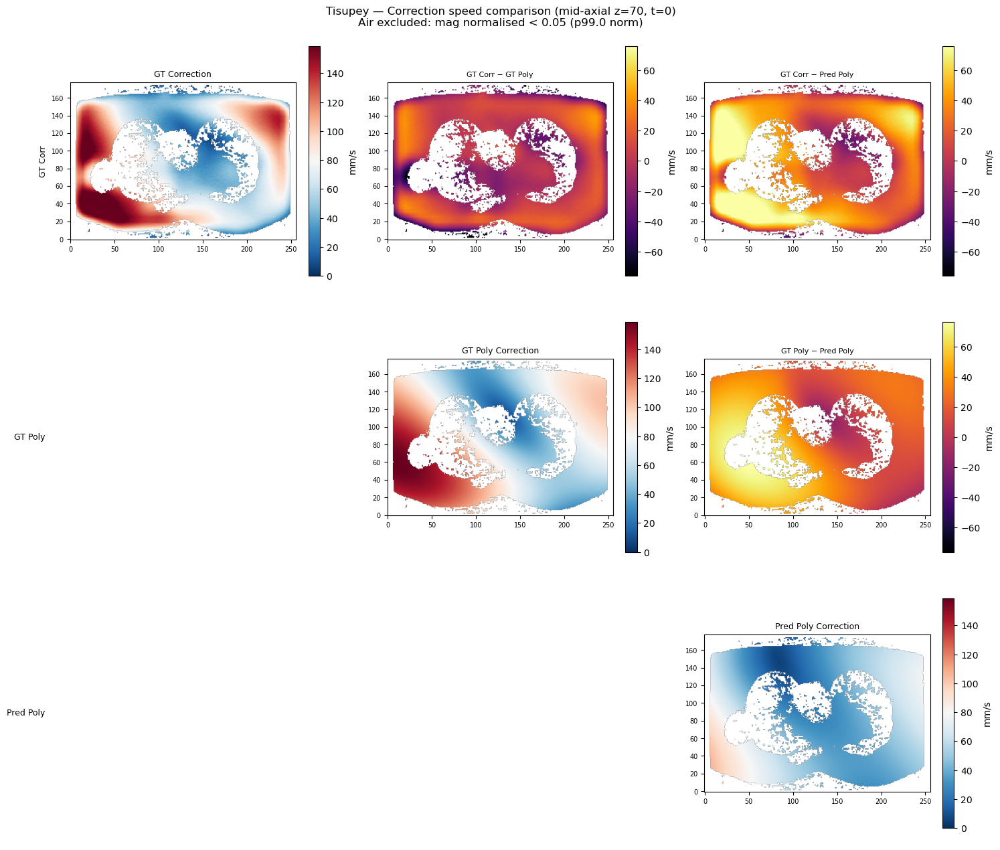

100%|██████████| 28/28 [00:54<00:00,  1.95s/it]


In [15]:
from tqdm import tqdm

GT_POLY_IDX = 1
PRED_POLY_IDX = 2

for pid in tqdm(patients):
    gt_corr_speed, gt_poly_speed, pred_poly_speed, tissue_mask = load_correction_speeds(pid, TIMEPOINT)
    speeds = [gt_corr_speed, gt_poly_speed, pred_poly_speed]

    mid_z = gt_corr_speed.shape[2] // 2

    fig, axes = plt.subplots(3, 3, figsize=(15, 13))

    slices = []
    for s in speeds:
        sl = s[:, :, mid_z].copy()
        if tissue_mask is not None:
            sl[~tissue_mask[:, :, mid_z]] = np.nan
        slices.append(sl)

    speed_vmax = np.nanmax(slices[GT_POLY_IDX])

    ref_diff = slices[GT_POLY_IDX] - slices[PRED_POLY_IDX]
    diff_abs_max = max(np.nanmax(np.abs(ref_diff)), 1e-12)

    for i in range(3):
        for j in range(3):
            ax = axes[i, j]

            if i == j:
                im = ax.imshow(
                    slices[i].T, origin="lower", cmap="RdBu_r",
                    vmin=0, vmax=speed_vmax,
                )
                ax.set_title(LABELS[i], fontsize=9)
                plt.colorbar(im, ax=ax, fraction=0.046, label="mm/s")
            elif i < j:
                diff = slices[i] - slices[j]
                im = ax.imshow(
                    diff.T, origin="lower", cmap="inferno",
                    vmin=-diff_abs_max, vmax=diff_abs_max,
                )
                ax.set_title(
                    f"{SHORT_LABELS[i]} \u2212 {SHORT_LABELS[j]}",
                    fontsize=8,
                )
                plt.colorbar(im, ax=ax, fraction=0.046, label="mm/s")
            else:
                ax.axis("off")

            if i <= j:
                ax.tick_params(labelsize=7)
            if j == 0 and i == 0:
                ax.set_ylabel(SHORT_LABELS[i], fontsize=9)
            if j == 0 and i > 0:
                ax.text(
                    -0.1, 0.5, SHORT_LABELS[i],
                    transform=ax.transAxes, fontsize=9,
                    va="center", ha="right",
                )

    fig.suptitle(
        f"{pid} \u2014 Correction speed comparison (mid-axial z={mid_z}, t={TIMEPOINT})\n"
        f"Air excluded: mag normalised < {AIR_THRESHOLD} (p{MAG_NORM_PERCENTILE} norm)",
        fontsize=12,
    )
    fig.tight_layout()
    plt.show()